In [3]:
%load_ext autoreload
%autoreload 2

caffe_root = "/home/atemmar/caffe/"
import sys
sys.path.insert(0, caffe_root + "/python/")
sys.path.insert(0, "/home/atemmar/Documents/Stage_ets/WeaklySupervisedLearning/src_python/")

import numpy as np
import matplotlib.pyplot as plt
import os
import scipy.ndimage
import cv2
import time
import scipy.misc
import caffe
import seaborn as sns
from IPython import display
import time
from utils_dataSpine import *

%matplotlib inline

size_image = (96,304)
sns.set_style("whitegrid", {'axes.grid' : False})

plt.rcParams['image.cmap'] = 'gray'

rep_dataset = "/home/atemmar/Documents/Data/FromFirasPng/"


# Read training set

In [9]:
indices = open(rep_dataset + "train.txt", 'r').read().splitlines()

files_x = [rep_dataset + line.split('\t')[0] for line in indices]
files_y = [rep_dataset + line.split('\t')[1] for line in indices]

# fileList = [f for f in list(os.walk(rep_traininSet))[0][2] if ".png" in f.lower()][:1000]
name_files_train = []
nb_image = 0
images_irm = np.zeros((size_image[0], size_image[1], len(files_x)))
labels = np.zeros((size_image[0], size_image[1], len(files_x)))
for file_x,file_y in zip(files_x, files_y):
    im = np.array(Image.open(file_x))
    im = preprocessing_im(im)
    label = np.array(Image.open(file_y))
    label = preprocessing_label(label) #resize

    images_irm[:,:,nb_image] = im
    labels[:,:,nb_image] = label
    
    name_files_train.append(os.path.basename(file_x)[:-4])
    

    nb_image += 1

# Read test set

In [10]:
indices = open(rep_dataset + "test.txt", 'r').read().splitlines()

files_x = [rep_dataset + line.split('\t')[0] for line in indices]
files_y = [rep_dataset + line.split('\t')[1] for line in indices]

# fileList = [f for f in list(os.walk(rep_traininSet))[0][2] if ".png" in f.lower()][:1000]

name_files_test = []
nb_image = 0
images_irm_test = np.zeros((size_image[0], size_image[1], len(files_x)))
labels_test = np.zeros((size_image[0], size_image[1], len(files_x)))
for file_x,file_y in zip(files_x, files_y):
    im = np.array(Image.open(file_x))
    im = preprocessing_im(im)
    label = np.array(Image.open(file_y))
    label = preprocessing_label(label) #resize

    images_irm_test[:,:,nb_image] = im
    labels_test[:,:,nb_image] = label
    
    name_files_test.append(os.path.basename(file_x)[:-4])
    
    nb_image += 1

# Training

In [2]:
caffe.set_device(0)
caffe.set_mode_gpu()
solver_name =  "models/U-net/solver_unet_softmax.prototxt"
solver = caffe.SGDSolver(solver_name)

for layer_name, blob in solver.net.blobs.iteritems():
    print layer_name + '\t' + str(blob.data.shape)

data	(1, 1, 304, 304)
label	(1, 1, 304, 304)
conv1a	(1, 32, 304, 304)
conv1b	(1, 32, 304, 304)
conv1co	(1, 32, 304, 304)
conv1co_conv1c_0_split_0	(1, 32, 304, 304)
conv1co_conv1c_0_split_1	(1, 32, 304, 304)
conv1c	(1, 32, 304, 304)
pool1	(1, 32, 152, 152)
conv2a	(1, 32, 152, 152)
conv2bo	(1, 32, 152, 152)
conv2bo_conv2b_0_split_0	(1, 32, 152, 152)
conv2bo_conv2b_0_split_1	(1, 32, 152, 152)
conv2b	(1, 32, 152, 152)
pool2	(1, 32, 76, 76)
conv3ao	(1, 32, 76, 76)
conv3ao_conv3a_0_split_0	(1, 32, 76, 76)
conv3ao_conv3a_0_split_1	(1, 32, 76, 76)
conv3a	(1, 32, 76, 76)
pool3	(1, 32, 38, 38)
deconv4	(1, 32, 76, 76)
deconv4ao	(1, 64, 76, 76)
deconv4r	(1, 64, 76, 76)
deconv5	(1, 32, 152, 152)
deconv5ao	(1, 64, 152, 152)
score	(1, 64, 152, 152)
deconv6	(1, 32, 304, 304)
deconv6ao	(1, 64, 304, 304)
deconv6r	(1, 64, 304, 304)
score-final	(1, 2, 304, 304)
loss	()


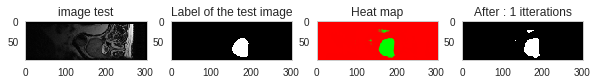

In [2]:
caffe.set_device(0)
caffe.set_mode_gpu()
solver_name =  "models/U-net/solver_unet_softmax.prototxt"
solver = caffe.SGDSolver(solver_name)

nb_step = 260000


rep_model  = "/home/atemmar/Documents/Stage_ets/caffe-release_segmentation/models_pretrained_rv/unet/"
model_weights = "/home/atemmar//Documents/Data/FromFirasPng/models_pretrained/U-net/train_unet_spine_softmax_iter_66000.caffemodel"
solver_file = "/home/atemmar//Documents/Data/FromFirasPng/models_pretrained/U-net/train_unet_spine_softmax_iter_" + str(nb_step) + ".solverstate"
solver.restore(solver_file)
# solver.net.copy_from(model_weights)

# solver.step(1)


do_training(solver=solver, step_size=nb_step)
# image_test = solver.test_nets[0].blobs["data"].data[0,0,:,:]
# image_test_label = solver.test_nets[0].blobs["label"].data[0,0,:,:]
# plt.subplot(1,2,1)
# plt.imshow(image_test)
# plt.title("image test")
# plt.subplot(1,2,2)
# plt.imshow(image_test_label)
# plt.title("Label of the test image")

value_loss = []

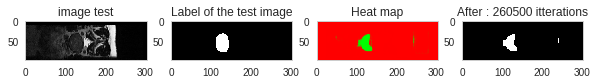

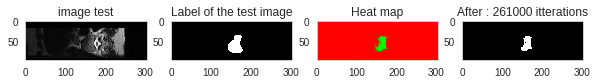

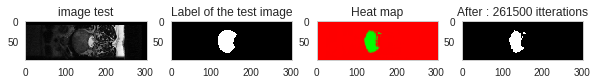

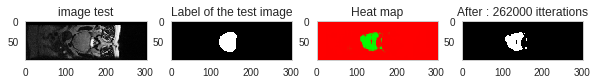

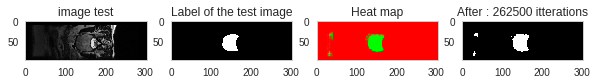

...

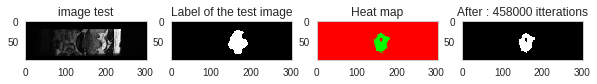

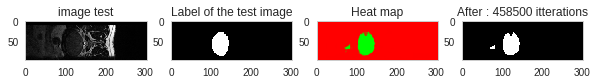

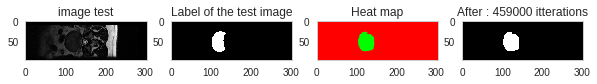

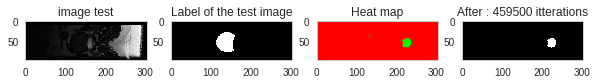

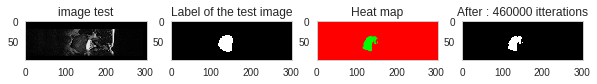

In [3]:
step_size = 500
for i in range(20*20):
    do_training(solver=solver, step_size=step_size, nb_step=nb_step)
    nb_step += step_size

# Read the features

In [15]:
model_def_deploy = rep_dataset + '/models/U-net/unet_deploy.prototxt'

model_weights = "/home/atemmar/Documents/Data/FromFirasPng/models_pretrained/U-net/train_unet_spine_softmax_iter_460000.caffemodel"
# model_weights = "/home/atemmar/Documents/Data/warwick_qu_dataset_released_2016_07_08/models_pretrained/U-net_vfull/train_unet_softmax_warwick_iter_10000.caffemodel"


caffe.set_device(0)
caffe.set_mode_gpu()
net_deploy = caffe.Net(model_def_deploy,      # defines the structure of the model
                model_weights, caffe.TEST)

In [8]:
import scipy.io

repSaveFeatures = rep_dataset + "/allfeatures/Unet/training/"


if not os.path.exists(repSaveFeatures):
    os.makedirs(repSaveFeatures)
    
# save features training 
for i in range(images_irm.shape[3]):
    img = images_irm[:,:,:,i]
    width_block = int(img.shape[1]/2)
    heigth_block = int(img.shape[0]/2)
    
    top_left_img, top_right_img, bot_left_img, bot_right_img = devide_four(img, heigth_block, width_block)
    img_sub = [top_left_img, top_right_img, bot_left_img, bot_right_img]
    
    for j in range(1,5):
        net_deploy.blobs["data"].data[...] = img_sub[j-1].transpose(2,0,1)
        net_deploy.forward()
    
        features = {}
        for layer_name, blob in net_deploy.blobs.iteritems():
            if not 'split' in layer_name:# and 'pool3' in layer_name: #split means a duplicate layer, it's not neccessary to save two times the informations
                data = net_deploy.blobs[layer_name].data
                features[layer_name] = data
        scipy.io.savemat(repSaveFeatures + name_files_train[i] + "_part"+ str(j) + "_features.mat", mdict=features)
    


In [10]:
# save features testing 
import scipy.io

repSaveFeatures = rep_dataset + "/allfeatures/Unet/testing/"


if not os.path.exists(repSaveFeatures):
    os.makedirs(repSaveFeatures)
    
# save features training 
for i in range(images_irm_test.shape[3]):
    img = images_irm_test[:,:,:,i]
    width_block = int(img.shape[1]/2)
    heigth_block = int(img.shape[0]/2)
    
    top_left_img, top_right_img, bot_left_img, bot_right_img = devide_four(img, heigth_block, width_block)
    img_sub = [top_left_img, top_right_img, bot_left_img, bot_right_img]
    
    for j in range(1,5):
        net_deploy.blobs["data"].data[...] = img_sub[j-1].transpose(2,0,1)
        net_deploy.forward()
    
        features = {}
        for layer_name, blob in net_deploy.blobs.iteritems():
            if not 'split' in layer_name:# and 'pool3' in layer_name: #split means a duplicate layer, it's not neccessary to save two times the informations
                data = net_deploy.blobs[layer_name].data
                features[layer_name] = data
        scipy.io.savemat(repSaveFeatures + name_files_test[i] + "_part"+ str(j) + "_features.mat", mdict=features)

# Results training set

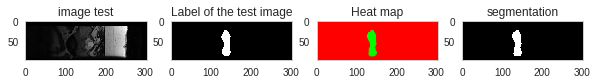

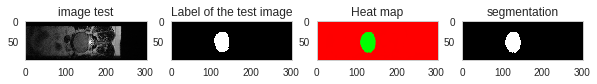

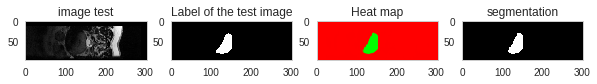

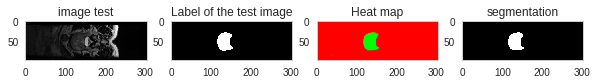

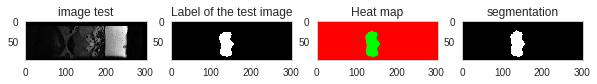

...

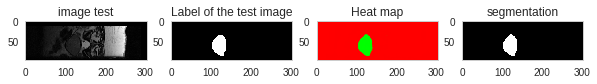

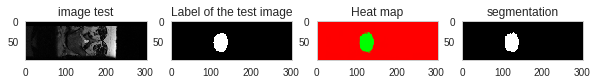

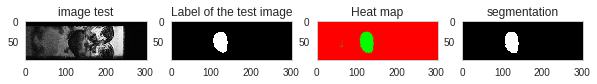

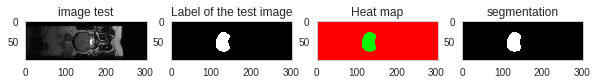

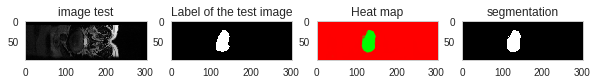

In [5]:
net = solver.net

for i in range(100):
    net.forward()
    heat_map = net.blobs["score-final"].data[0,:,:,:].transpose(1,2,0)
    heat_map_normalize = normalize_heatmap(heat_map)
#         heat_map_normalize = heat_map
    minimum = np.min(heat_map[:,:,0])

    nb_subplot = 4
    plt.figure(figsize=(10,10))
    image_test = net.blobs["data"].data[0,0,:,:]
    image_test_label = net.blobs["label"].data[0,0,:,:]
    plt.subplot(1,nb_subplot,1)
    plt.imshow(image_test)
    plt.title("image test")
    plt.subplot(1,nb_subplot,2)
    plt.imshow(image_test_label)
    plt.title("Label of the test image")
    plt.subplot(1,nb_subplot,3)
    plt.imshow(np.append(heat_map_normalize, np.zeros((heat_map_normalize.shape[0], heat_map_normalize.shape[1],1)), 2))
    plt.title("Heat map")
#     plt.subplot(1,nb_subplot,4)
#     plt.imshow(np.append(heat_map_normalize, np.zeros(heat_map_normalize.shape[0], heat_map_normalize.shape[1],1), 3))
#     plt.title("score")
    plt.subplot(1,nb_subplot,4)
    plt.imshow(net.blobs["score-final"].data[0,:,:,:].transpose(1,2,0).argmax(2), vmin=0, vmax=1)
    plt.title("segmentation")
#     display.display(plt.gcf())
#     display.clear_output(wait=True)
#     time.sleep(1)
    


In [ ]:
rep_save_results = rep_dataset + "results/unet/training_20/"
display_results(dataset=images_irm, labels=labels, net_deploy=net_deploy, rep_save_results=None, nameFiles=name_files_train)

# Results test set

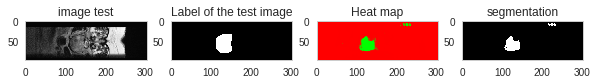

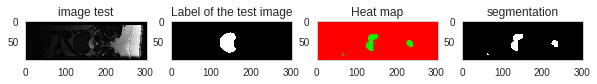

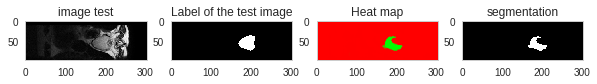

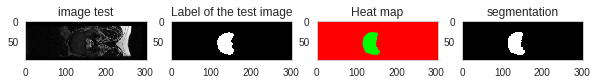

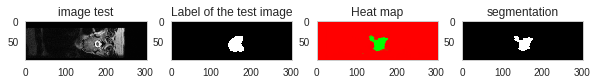

...

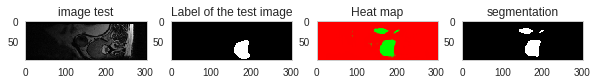

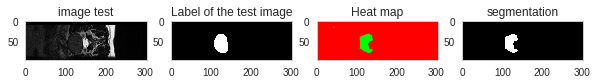

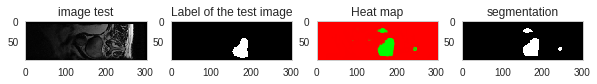

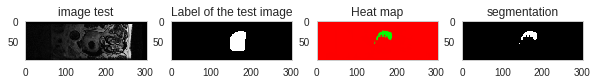

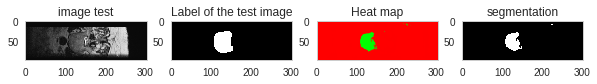

In [4]:
net = solver.test_nets[0]

for i in range(100):
    net.forward()
    heat_map = net.blobs["score-final"].data[0,:,:,:].transpose(1,2,0)
    heat_map_normalize = normalize_heatmap(heat_map)
#         heat_map_normalize = heat_map
    minimum = np.min(heat_map[:,:,0])

    nb_subplot = 4
    plt.figure(figsize=(10,10))
    image_test = net.blobs["data"].data[0,0,:,:]
    image_test_label = net.blobs["label"].data[0,0,:,:]
    plt.subplot(1,nb_subplot,1)
    plt.imshow(image_test)
    plt.title("image test")
    plt.subplot(1,nb_subplot,2)
    plt.imshow(image_test_label)
    plt.title("Label of the test image")
    plt.subplot(1,nb_subplot,3)
    plt.imshow(np.append(heat_map_normalize, np.zeros((heat_map_normalize.shape[0], heat_map_normalize.shape[1],1)), 2))
    plt.title("Heat map")
#     plt.subplot(1,nb_subplot,4)
#     plt.imshow(np.append(heat_map_normalize, np.zeros(heat_map_normalize.shape[0], heat_map_normalize.shape[1],1), 3))
#     plt.title("score")
    plt.subplot(1,nb_subplot,4)
    plt.imshow(net.blobs["score-final"].data[0,:,:,:].transpose(1,2,0).argmax(2), vmin=0, vmax=1)
    plt.title("segmentation")
#     display.display(plt.gcf())
#     display.clear_output(wait=True)
#     time.sleep(1)
    

In [ ]:
rep_save_results = rep_dataset + "results/unet/test_20/"
display_results(dataset=images_irm_test, labels=labels_test, net_deploy=net_deploy, rep_save_results=None, nameFiles=name_files_test)

# Dice in training

In [36]:
dices = compute_dice_dataset(images_irm, labels, net_deploy)

0.954377311961
0.951749539595
0.97263681592
0.974795019739
0.966224366707
0.96247582205
0.968788249694
0.960806270997
0.968117719191
0.942477876106
0.972670398419
0.953521528372
0.963444354184
0.968870441743
0.968565203859
0.959902794654
0.936124530327
0.941791044776
0.956450956451
0.95973705834
0.956342668863
0.966275659824
0.956914733353
0.967741935484
0.97011771808
0.973833902162
0.971182510765
0.910218739798
0.928988326848
0.922420687817
0.962843295638
0.968117929379
0.956488549618
0.93075954679
0.943273092369
0.954706577393
0.95856873823
0.970056329677
0.940436241611
0.957230142566
0.938683498647
0.950367107195
0.956417433027
0.899099099099
0.95881383855
0.955074875208
0.969023034154
0.956599820413
0.947976878613
0.965079365079
0.951719092904
0.964439234076
0.947479732111
0.957602805228
0.964588144727
0.972033257748
0.963746223565
0.929712460064
0.940721649485
0.941664198993
0.96253776435
0.930118512464
0.936690647482
0.952541420949
0.976955533918
0.93992248062
0.961508654095
0.96

In [37]:
np.mean(dices)

0.96600860676033395

# Dice in testing

In [34]:
dices = compute_dice_dataset(images_irm_test, labels_test,net_deploy)

0.574894217207
0.734740444952
0.622458554895
0.694692590646
0.503260225252
0.620689655172
0.690929142542
0.673835125448
0.725188978298
0.693994280267
0.631170271769
0.688427299703
0.617829248586
0.605382521923
0.596521243228
0.74050294275
0.822095857027
0.732636754763
0.709119496855
0.452138492872
0.602203856749
0.623798475307
0.64829586657
0.875347544022
0.724570842941
0.90459528808
0.664739884393
0.638596491228
0.753183153771
0.704756543766
0.53935356526
0.600966183575
0.707216494845
0.682289097188
0.687347507842
0.654301906234
0.75086164451
0.581174984207
0.668661588683
0.760134262845
0.55017921147
0.756162915327
0.633819241983
0.865850612041
0.824234639264
0.873616473616
0.512318029115
0.821548821549
0.729278794403
0.570924488356
0.789632611978
0.76333656644
0.689748444685
0.627243306855
0.823194408491
0.795598220557
0.73517169615
0.515183246073
0.769114307343
0.654333675916
0.751620947631
0.620394173093
0.717991631799
0.717613190264
0.789947842579
0.696723460026
0.693166349033
0.6

In [35]:
np.mean(dices)

0.77163726653720977

# Dice testing itterationss 

In [4]:
model_def_deploy = rep_dataset + '/models/U-net/unet_deploy.prototxt'
rep_prediction_unlab = rep_dataset + "/prediction_tmp/"

nb_itters = [4000, 8000, 12000, 16000, 20000, 24000, 38000, 42000 ,46000, 50000, 54000, 58000, 62000]

gts = load_dataset(rep_dataset + "unlab.txt", rep_dataset + "/", readInputs=False)

for epoch, nb_itter in enumerate(nb_itters):
    print epoch

    model_weights = "/home/atemmar/Documents/Data/FromFirasPng/models_pretrained/U-net/train_unet_spine_softmax_iter_" + str(nb_itter) + ".caffemodel"
    # model_weights = "/home/atemmar/Documents/Data/warwick_qu_dataset_released_2016_07_08/models_pretrained/U-net_vfull/train_unet_softmax_warwick_iter_10000.caffemodel"


#     caffe.set_device(0)
#     caffe.set_mode_gpu()
#     net_deploy = caffe.Net(model_def_deploy,      # defines the structure of the model
#                     model_weights, caffe.TEST)
    
    prediction = load_dataset(rep_dataset + "unlab.txt", rep_dataset + "/prediction_tmp/epoch_" + str(epoch)+"/", readInputs=False)
    dice = compute_dice_dataset(gts=gts, prediction=prediction)
    
    print "epoch " + str(epoch) + " : " + str(np.average(dice))

0
epoch 0 : 0.43640387071
1
epoch 1 : 0.436259685734
2
epoch 2 : 0.437422041685
3
epoch 3 : 0.437738440888
4
epoch 4 : 0.43768983016
5
epoch 5 : 0.437596796037
6
epoch 6 : 0.438297499645
7
epoch 7 : 0.438316395306
8
epoch 8 : 0.438747883878
9
epoch 9 : 0.439000590627
10
epoch 10 : 0.439463830758
11
epoch 11 : 0.440058616184
12
epoch 12 : 0.440755214328


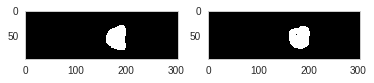

In [41]:
num_test = 700
plt.subplot(1,2,1)
plt.imshow(gts[:,:,num_test])
plt.subplot(1,2,2)
plt.imshow(prediction[:,:,num_test])

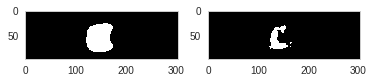

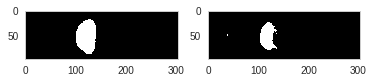

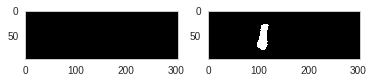

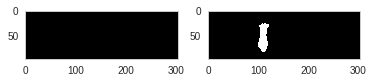

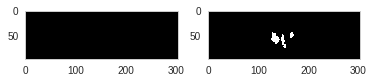

...

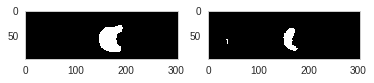

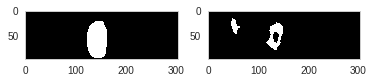

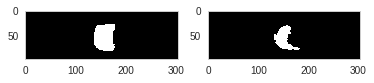

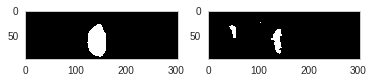

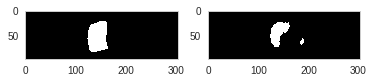

In [6]:
nb_images = prediction.shape[2]
numplot = 1
for num_image in range(nb_images):
    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(gts[:,:,num_image])
    plt.subplot(1,2,2)
    plt.imshow(prediction[:,:,num_image])
#     numplot +=2
    plt.show()